# Enfermedades mentales en tecnología
## Facultad TIC Universidad Pontificia Bolivariana <a class="tocSkip">

**Estudiante:** Nathalia Andrea Ortega Gómez

**ID:** 000200550

**Email:** nathalia.ortega@upb.edu.co

**Fecha de Entrega: 22 de Octubre de 2020**

## Introducción

Cada año, [OSMI](https://osmihelp.org/) (open sourcing mental illness) realiza una encuesta a gran escala sobre la prevalencia y las actitudes hacia la salud mentall de las personas que trabajan en la industria tecnológica.

Las posibles salidas para la predicción son:
- Yes (tiene actualmente una enfermedad mental)
- No (No tiene una enfermedad mental)

## Objetivo principal
** Predecir qué empleados tienen más probabilidad de padecer una enfermedad mental. **

## Información de los datos
El dataset original contiene muchos datos faltantes, redundantes y ruidosos como es de esperarse en los datos del mundo real.

El dataset original, contenía como encabezados las preguntas de la encuesta, las cuales fueron transformadas a nombres más pequeños y discientes. A pesar de que, existen columnas con su mayoría de registros vacíos.

## dataset
Se unieron dos datsets de la misma encuesta ([las respuestas para el 2017](https://www.kaggle.com/osmihelp/osmi-mental-health-in-tech-survey-2017) y las [respuestas para el 2018](https://www.kaggle.com/osmihelp/osmi-mental-health-in-tech-survey-2018)) teniendo en cuenta que ambas contienen las mismas preguntas y que cada una cuenta con más de 500 registros.

# Importar librerías

In [2]:
pip install pandas


You should consider upgrading via the 'C:\Users\natya\AppData\Local\Programs\Python\Python38\python.exe -m pip install --upgrade pip' command.


In [3]:
pip install numpy

Note: you may need to restart the kernel to use updated packages.
You should consider upgrading via the 'C:\Users\natya\AppData\Local\Programs\Python\Python38\python.exe -m pip install --upgrade pip' command.


In [4]:
pip install matplotlib


You should consider upgrading via the 'C:\Users\natya\AppData\Local\Programs\Python\Python38\python.exe -m pip install --upgrade pip' command.


In [5]:
pip install seaborn

You should consider upgrading via the 'C:\Users\natya\AppData\Local\Programs\Python\Python38\python.exe -m pip install --upgrade pip' command.



In [6]:
pip install sklearn


You should consider upgrading via the 'C:\Users\natya\AppData\Local\Programs\Python\Python38\python.exe -m pip install --upgrade pip' command.


In [7]:
pip install pandas_profiling

You should consider upgrading via the 'C:\Users\natya\AppData\Local\Programs\Python\Python38\python.exe -m pip install --upgrade pip' command.



In [8]:
pip install scipy

Note: you may need to restart the kernel to use updated packages.
You should consider upgrading via the 'C:\Users\natya\AppData\Local\Programs\Python\Python38\python.exe -m pip install --upgrade pip' command.


In [9]:
pip install imblearn

Note: you may need to restart the kernel to use updated packages.
You should consider upgrading via the 'C:\Users\natya\AppData\Local\Programs\Python\Python38\python.exe -m pip install --upgrade pip' command.


In [10]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.
You should consider upgrading via the 'C:\Users\natya\AppData\Local\Programs\Python\Python38\python.exe -m pip install --upgrade pip' command.


In [11]:
import pandas as pd
import numpy as np
import seaborn as sns
import csv
from googletrans import Translator
%matplotlib inline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
import scipy.stats as stats
from scipy.stats import chi2_contingency
from sklearn.model_selection import train_test_split
from sklearn import model_selection
import plotly.express as px
import matplotlib.pyplot as plt

# Cargar los datos

In [12]:
mentalHealth_data = pd.read_csv("../data/processed/data_imbalanced.csv")

In [13]:
mentalHealth_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 663 entries, 0 to 662
Data columns (total 34 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   No_empleados                                663 non-null    object 
 1   cubrimiento_EM                              663 non-null    object 
 2   concimiento_cubrimiento_EM                  663 non-null    int64  
 3   recursos_EM                                 663 non-null    object 
 4   dejar_trabajo_EM                            663 non-null    object 
 5   habla_jefe_EM_flag                          663 non-null    float64
 6   hablar_companeros_EM_flag                   663 non-null    float64
 7   hablar_companeros_EM_conmigo                663 non-null    float64
 8   importacia_salud_fisica                     663 non-null    float64
 9   importancia_salud_mental                    663 non-null    float64
 10  trabajado_otra

## Conversión de variables

In [14]:
cat_cols = list(mentalHealth_data.select_dtypes('object').columns)
class_dict = {}
for col in cat_cols:
    mentalHealth_data = pd.concat([mentalHealth_data.drop(col, axis=1), pd.get_dummies(mentalHealth_data[col], prefix=col, drop_first=True)], axis=1)

In [15]:
mentalHealth_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 663 entries, 0 to 662
Data columns (total 62 columns):
 #   Column                                                               Non-Null Count  Dtype  
---  ------                                                               --------------  -----  
 0   concimiento_cubrimiento_EM                                           663 non-null    int64  
 1   habla_jefe_EM_flag                                                   663 non-null    float64
 2   hablar_companeros_EM_flag                                            663 non-null    float64
 3   hablar_companeros_EM_conmigo                                         663 non-null    float64
 4   importacia_salud_fisica                                              663 non-null    float64
 5   importancia_salud_mental                                             663 non-null    float64
 6   trabajado_otras_empresa                                              663 non-null    int64  
 7   empresa_

In [16]:
from pandas_profiling import ProfileReport
profile2 = ProfileReport(mentalHealth_data, title="mental health data Profiling Report 2" )
profile2.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:05<00:00,  5.91s/it]


In [17]:
profile2.to_file("../reports/mentalHealth_data_profiling_bivariate_report_2.html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 11.17it/s]


# Entradas y salidas

In [18]:
X = mentalHealth_data.drop("tiene_EM", axis=1)
y= mentalHealth_data["tiene_EM"]

# Dividir los datos 70/30
Dado que la variable objetivo está tan desbalanceada, es necesario utilizar stratify para asegurarse de que tome una muestra representativa de los datos

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3,random_state =42, stratify=y)

In [20]:
#Se verifica que tanto en el dataset de entrenamiento como en el de prueba, exista una cantidad similar de valores positivos 
perc_test = y_test.value_counts()[1]*100/len(y_test)
perc_train = y_train.value_counts()[1]*100/len(y_train)

print(f" Porcentaje de positivos en el dataset de prueba={perc_test} , dataset de entrenamiento={perc_train}")

 Porcentaje de positivos en el dataset de prueba=68.84422110552764 , dataset de entrenamiento=69.18103448275862


# Selección de la medida
Hacer un mal diagnostico de una enfermedad mental puede llegar a tener efectos negativos en las personas, como:

- Confusión
- Medicación incorrecta
- Alteración hormonal
- Empeorar la condición del paciente y generar nuevas enfermedades

[Psychology today](https://www.psychologytoday.com/us/blog/experimentations/201805/6-reasons-common-psych-diagnostic-mistakes)

[Healing and hope for children and families](https://hside.org/impact-of-mental-health-misdiagnosis/)

Por esta razón, necesito predicciones de mucha confianza y utilizo la medida:

> ** Precision **


In [21]:
#Medidas
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

In [22]:
#algoritmos
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier, XGBRFClassifier

# Selección del modelo

In [23]:
seed =2
models = []

#logistic Regression
models.append(('LR', LogisticRegression(solver='liblinear')))

# Decision Tree classifier
models.append(('TREE', DecisionTreeClassifier()))

# Naïve Bayes
models.append(('NB', GaussianNB()))
# SVM
models.append(('SVM', SVC(C=1.0, kernel='rbf', max_iter=1000, tol=1e-3)))

#Random forest
models.append(('Random forest', RandomForestClassifier(max_depth=2, random_state=0)))
# evaluate each model in turn
results = []
names = []
scoring = 'precision'
for name, model in models:
	# Kfol cross validation for model selection
	kfold = model_selection.KFold(n_splits=10, random_state=seed)
	#X train , y train
	cv_results = model_selection.cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
	results.append(cv_results)
	names.append(name)
	msg = f"({name}, {cv_results.mean()}, {cv_results.std()})"
	print(msg)

(LR, 0.8935992079779295, 0.04360372405012801)
(TREE, 0.8603204832160207, 0.0577531961487212)
(NB, 0.9013857916791732, 0.052057729060921855)
(SVM, 0.6919056429232193, 0.05938428469061665)
(Random forest, 0.8744296562057847, 0.048923385014751665)


In [24]:
result_df = pd.DataFrame(results, index=names).T
px.box(result_df,title = 'Algorithm Comparison')

In [25]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

In [26]:
# Naïve Bayes with standardscaler
NB_pipeline = make_pipeline( StandardScaler(), GaussianNB())
models.append(('NB_pipeline', NB_pipeline))

In [27]:
scoring = 'precision'
name, model
# Kfol cross validation for model selection
kfold = model_selection.KFold(n_splits=10, random_state=seed)
#X train , y train
cv_results = model_selection.cross_val_score(NB_pipeline, X_train, y_train, cv=kfold, scoring=scoring)
results.append(cv_results)
names.append('NB_pipeline')
msg = f"({'NB_pipeline'}, {cv_results.mean()}, {cv_results.std()}"
print(msg)

(NB_pipeline, 0.9007392399550354, 0.05164368315541412


El pipeline no mejora mucho los resultados

# Hiperparametrización
Se hace con gridsearch, buscando los mejores parametros

In [28]:
#calculos previos, se imprime la el porcentaje de negativos y positivos en el dataset 
y.value_counts()/len(y)

1    0.690799
0    0.309201
Name: tiene_EM, dtype: float64

In [29]:
a,b = y.value_counts()/len(y)

In [30]:
#Se corre el modelo con los mejores parametros
from sklearn.model_selection import GridSearchCV
parameters = {'priors': [None, [a,b]]}
#grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], "penalty":["l1","l2"]}# l1 lasso l2 ridge
grid_search = GridSearchCV(GaussianNB(), parameters,scoring='precision', cv=10,return_train_score=True)
grid_search.fit(X_train, y_train)
grid_search.best_params_

{'priors': [0.6907993966817496, 0.3092006033182504]}

# Matriz de confusión

In [31]:
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_precision_recall_curve

### Naïve Bayes 

In [32]:
NB_tech = GaussianNB()
NB_tech.fit(X_train,y_train)
y_pred = grid_search.predict(X_test)

In [33]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.69      0.81      0.75        62
           1       0.91      0.84      0.87       137

    accuracy                           0.83       199
   macro avg       0.80      0.82      0.81       199
weighted avg       0.84      0.83      0.83       199



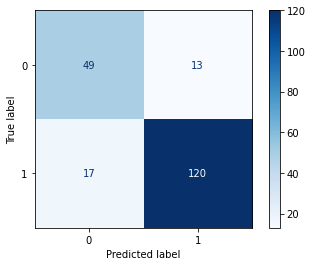

In [34]:
plot_confusion_matrix(NB_tech, X_test, y_test,cmap=plt.cm.Blues)

### Interpretación:
El modelo no entrega muy buenos resultados, clasifica:
- 120 como verdaderos positivos:fue diagnosticado con una enfermedad mental cuando no tenía
- 49 verdaderos negativos: fue diagnosticado con una enfermedad mental y si tiene una enfermedad mental
- 17 como falsos positivos: no fue diagnosticado con una enfermedad mental y no tiene una enfermedad mental
- 13 falsos negativos: no fue diagnosticado con una enfermedad mental y si tiene una enfermedad mental

In [35]:
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
precision = tp / (tp+fp)
precision

0.905511811023622

### Naïve Bayes con estandarización

In [36]:
NB_pipeline.fit(X_train,y_train)
y_pred = NB_pipeline.predict(X_test)

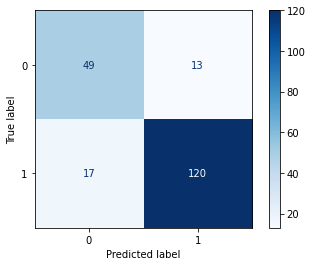

In [37]:
plot_confusion_matrix(NB_pipeline, X_test, y_test,cmap=plt.cm.Blues)

In [38]:
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
precision = tp / (tp+fp)
precision

0.9022556390977443

El modelo escogido es Naïve Bayes sin escalamiento, tiene el mismo resultado que el que no tiene escalamiento

## Probar un Naïve Bayes
La importancia de permutaciones por caracteristica expresa la relacion entre la caracteristica y la variable objetivo. Indica de cuanto un modelo depende de dicha caracteristica.

In [39]:
from sklearn.inspection import permutation_importance

In [40]:
imps = permutation_importance(NB_pipeline, X_test, y_test, n_repeats = 5,scoring='precision', n_jobs=-1, random_state=42)

Text(0.5, 1.0, 'Permutation Importances (test set)')

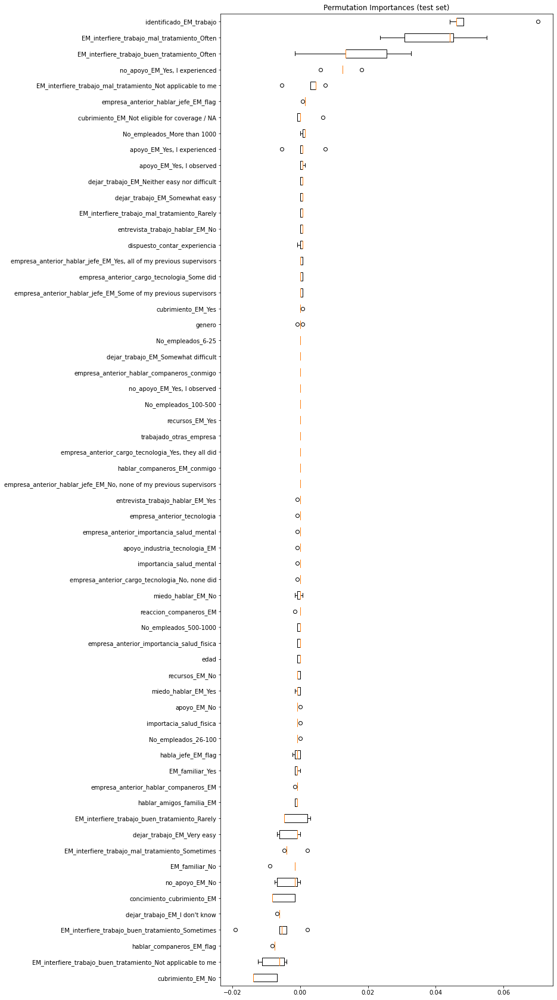

In [41]:
fig= plt.figure(figsize=(10,30))
perm_sorted_idx = imps.importances_mean.argsort()
plt.boxplot(imps.importances[perm_sorted_idx].T, vert=False,
            labels=X_test.columns[perm_sorted_idx])
plt.title("Permutation Importances (test set)")

In [42]:
#Variables que efcatn su reusltado
vari = list(X_test.columns[perm_sorted_idx][-5:])
print('Estas variable son importantes para el resultado del Naïve Bayes ')

[print(x) for x in vari]

Estas variable son importantes para el resultado del Naïve Bayes 
EM_interfiere_trabajo_mal_tratamiento_Not applicable to me
no_apoyo_EM_Yes, I experienced
EM_interfiere_trabajo_buen_tratamiento_Often
EM_interfiere_trabajo_mal_tratamiento_Often
identificado_EM_trabajo


[None, None, None, None, None]

In [43]:
from joblib import dump 
dump(NB_pipeline, '../models/NB_normal_imbalance_precision.joblib')

['../models/NB_normal_imbalance_precision.joblib']

# Datos balanceados
Tenemos los mismos valores X y y.

In [44]:
## Balancear los datos de entrenamiento
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=27)
X_train, y_train = sm.fit_sample(X_train, y_train)

## Selección del modelo

In [45]:
seed =2
models = []

#logistic Regression
models.append(('LR', LogisticRegression(solver='liblinear')))

# Decision Tree classifier
models.append(('TREE', DecisionTreeClassifier()))

# Naïve Bayes
models.append(('NB', GaussianNB()))
# SVM
models.append(('SVM', SVC(C=1.0, kernel='rbf', max_iter=1000, tol=1e-3)))

#Random forest
models.append(('Random forest', RandomForestClassifier(max_depth=3, random_state=0)))
# evaluate each model in turn
results = []
names = []
scoring = 'precision'
for name, model in models:
	# Kfol cross validation for model selection
	kfold = model_selection.KFold(n_splits=10, random_state=seed)
	#X train , y train
	cv_results = model_selection.cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
	results.append(cv_results)
	names.append(name)
	msg = f"({name}, {cv_results.mean()}, {cv_results.std()})"
	print(msg)

(LR, 0.7077550427414971, 0.3568245349953015)
(TREE, 0.6867138817464481, 0.34944740417239556)
(NB, 0.6973902685592595, 0.3522017588615392)
(SVM, 0.6780339957167337, 0.36725536557946165)
(Random forest, 0.7174163003141523, 0.3645010294341114)


In [45]:
result_df = pd.DataFrame(results, index=names).T
px.box(result_df,title = 'Algorithm Comparison')

## Hiperparametrización

In [46]:
y.value_counts()/len(y)

1    0.690799
0    0.309201
Name: tiene_EM, dtype: float64

In [47]:
a,b = y.value_counts()/len(y)

In [48]:
parameters = {'priors': [None, [a,b]]}
grid_search = GridSearchCV(GaussianNB(), parameters, cv=10,return_train_score=True)
grid_search.fit(X_train, y_train)

grid_search.best_params_

{'priors': None}

In [49]:
NB_balanced = GaussianNB() 
NB_balanced.fit(X_train,y_train)
y_pred = grid_search.predict(X_test)

In [50]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.81      0.69      0.75        62
           1       0.87      0.93      0.90       137

    accuracy                           0.85       199
   macro avg       0.84      0.81      0.82       199
weighted avg       0.85      0.85      0.85       199



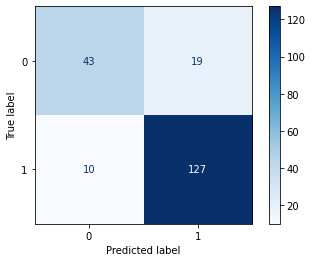

In [51]:
plot_confusion_matrix(NB_balanced, X_test, y_test,cmap=plt.cm.Blues)

In [46]:
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
precision = tp / (tp+fp)
precision

0.9022556390977443

In [52]:
dump(NB_balanced, '../models/NB_balance_accuracy.joblib')

['../models/NB_balance_accuracy.joblib']

# Conclusiones
- El modelo más preciso teniendo este dataset es el Naïve Bayes desbalanceado y sin estandarizar (sin quitar la media ni estandarizando la varianza), clasifica los verdaderos positivos

- En este caso, luego de la limpieza, quedó un dataset con muy pocos registros (663) al tener más datos los modelos funcionarían mejor, es posible tener mejor aprendizaje y por tanto un mejor resultado en la medida de precision

- Al tener más del 60% de los datos recolectados como lugar de vivienda o trabajo en Estados Unidos, el grupo étnico no tiene una gran relevancia pues en este país el 76% de la población es de origen blanco ([US Census](https://www.census.gov/quickfacts/fact/table/US/PST045219))

- Si bien es cierto que estadisticamente para 2019 ([statista](https://www.statista.com/statistics/252311/mental-illness-in-the-past-year-among-us-adults-by-age-and-gender/#:~:text=In%20the%20United%20States%2C%20the,to%2016%20percent%20of%20males.)), son las mujeres las que más sufren de enfermedades mentales en los Estados Unidos (24% mujeres y 16% hombres de la población total) en este caso son los hombres, debido a que el 70% de los encuestados son hombres. Historicamente la industria de la tecnología ha sido dominada por los hombres y solo el 26% de la industria es ocupada por las mujeres, a pesar de esto en los ultimos años se han creado nuevas y mejores estrategias para atraer mujeres en la industria ([Better workplaces](https://www.shrm.org/hr-today/news/all-things-work/pages/disrupting-the-tech-profession-gender-gap.aspx)).

- La industria tecnologica se caracteriza por su innovación, resiliencia y una cultura que fomente la alta productividad; es un ritmo de juego rápido, está bajo una intensa presión para tener exito y mantenerse a la vanguardia. Debido a esto, los empleados de la insutria tecnologica operan bajo un nivel de estrés alto con horarios anormales, plazos ajustados, múltiples responsabilidades y disponibilidad en cualquier momento del día ([IQmetrix](https://https://www.iqmetrix.com/blog/lets-talk-its-time-to-get-serious-about-mental-illness-in-tech)).

- De acuerdo con los resultados de [OSMI 2016](https://osmihelp.org/blog/the-osmi-2016-survey-results-are-part-of-data), el 51% de los profesionales que trabajan en tecnología fueron diagnosticados con una enfermedad mental, su verdadero problema radica en lo invisible de una enfermedad mental, se convierte en una batalla privada y es dificil saber cuando las personas necesitan ayuda. No brindar la ayuda que verdaderamente se necesita causaría problemas de mayor índole al rendimiento en el trabajo y en la calidad de vida. 

- Analizando el reporte de perfilamiento de los datos en este proyecto, puede evidenciarse que al 68% de las personas no se les habla en su empresa acerca de enfermedades mentales y solo el 30% afirma que en sus empresas existen recursos para aprender acerca de enfermedades mentales y a partir de esto puede concluirse que las empresas no están conscientes de lo importante que es la salud mental y su correcto tratamiento en la calidad de vida y el rendimiento laboral de las personas. En esta encuesta el 67% de las personas afirmaron que su trabajo se veia afectado por un mal tratamiento a una enfermedad mental.

- A pesar de todo lo anterior, los estigmas a las enfermedades mentales han ido cambiado con el pasar de los años, existen más espacios donde hablar estos temas y mejor cubrimiento para las enfermedades y trastornos mentales en los planes de salud ([Forbes](https://www.forbes.com/sites/markhall/2020/02/04/mental-health-mainstream/#cec59ac5cd5e)), entendendiendo así la importancia de la salud mental tanto en el desempeño del trabajo, como el mejoramiento de la calidad de vida . [En 2018, un estudio](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5891372/) reveló que el 86% de los empleados que reciben apoyo y atención a las enfermedades mentales por parte de sus empresas, reportan un mejor desempeño y menor ausencia en sus trabajos. Analizando los datos de la encuesta en este proyecto, el 63% de las personas que recibieron un buen tratamiento no han visto afectado su trabajo.
